#### Luis Alejandro Rodríguez Arenas Cod. 202321287

# BLOQUE 1 Imports y configuración

In [1]:
import numpy as np
from numpy import linspace
import matplotlib.pyplot as plt
from sympy import symbols, sin, cos, pi, integrate, lambdify, simplify, latex, exp
from sympy import init_printing
from sympy import Piecewise
from matplotlib.animation import FuncAnimation

init_printing(use_latex='mathjax') 

In [2]:
x, t = symbols('x t', real=True)

# BLOQUE 2 - Parámetros físicos del problema

# ej 1 10-5
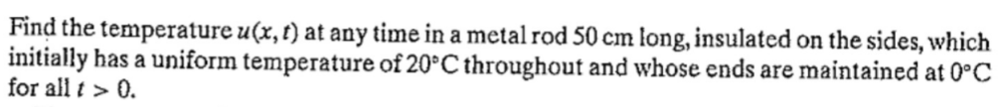

In [ ]:
L = 50
alpha = 2
T0 = 0
TL = 0

f = 20

print("Función inicial f(x) =")
display(f)

# ej 1 10-6
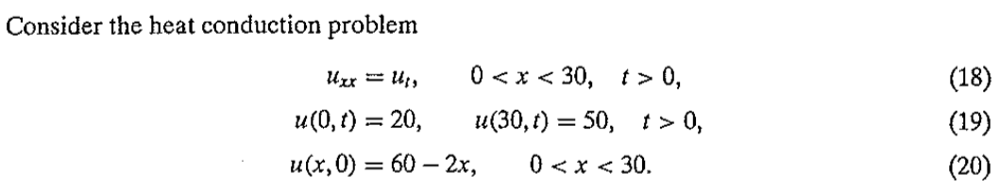

In [3]:
L = 30
alpha = 2
T0 = 20
TL = 50

f = 60-2*x

print("Función inicial f(x) =")
display(f)

Función inicial f(x) =


60 - 2⋅x

# ej 1 10-7
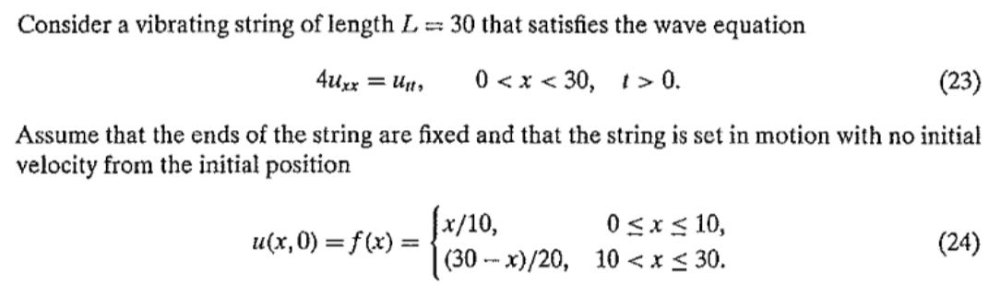

In [16]:
L = 30
a = 4
T0 = 0
TL = 0 

f = Piecewise(
    (x/10,  (0 <= x) & (x <= 10)),
    ((30-x)/20, (10 < x) & (x <= 30)),
    (0, x > 30),
)

print("Función inicial f(x) por tramos =")
display(f)

Función inicial f(x) por tramos =


⎧  x                        
⎪  ──    for x ≥ 0 ∧ x ≤ 10 
⎪  10                       
⎪                           
⎨3   x                      
⎪─ - ──  for x ≤ 30 ∧ x > 10
⎪2   20                     
⎪                           
⎩  0         for x > 30     

#### Ejemplo para molestar a [FTCS](https://en.wikipedia.org/wiki/FTCS_scheme) 

In [ ]:

L = 30   
alpha = 2
T0 = 0
TL = 0

f = sin(15*pi*x/L) + sin(35*pi*x/L)

### Separación en parte estacionaria + transitoria

In [17]:

# Parte estacionaria v(x): resolviendo v''(x)=0, v(0)=T0, v(L)=TL
v = T0 + (TL - T0) * (x/L)

print("Solución estacionaria v(x) =")
display(v)

# Condición inicial para v(x,0): v0(x) = f(x) – s(x)
v0 = simplify(f - v)

print("\nv(x,0) = f(x) - s(x) =")
display(v0)


Solución estacionaria v(x) =


0


v(x,0) = f(x) - s(x) =


⎧  x                        
⎪  ──    for x ≥ 0 ∧ x ≤ 10 
⎪  10                       
⎪                           
⎪3   x                      
⎨─ - ──  for x ≤ 30 ∧ x > 10
⎪2   20                     
⎪                           
⎪  0         for x > 30     
⎪                           
⎩ nan         otherwise     

# BLOQUE 4 - Serie de Fourier
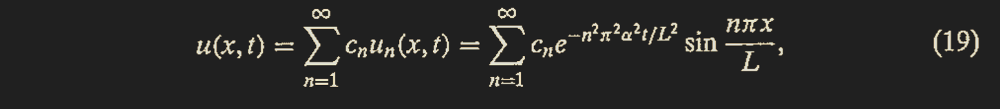
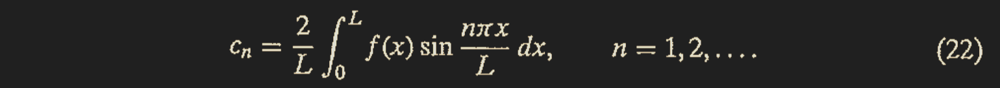

In [18]:
# Fórmula simbólica del coeficiente c_n
n = symbols('n', integer=True, positive=True)
cn_formula = (2/L) * integrate(v0 * sin(n*pi*x/L), (x, 0, L))

print("Coeficiente general c_n =")
display(simplify(cn_formula))

Coeficiente general c_n =


       ⎛π⋅n⎞
9.0⋅sin⎜───⎟
       ⎝ 3 ⎠
────────────
    2  2    
   π ⋅n     

In [6]:
# Para calor
print("u(x,T) =")
display(cn_formula * exp(-(alpha*n*pi/L)**2 * t) * sin(n*pi*x/L))

u(x,T) =


                        2  2              
                      -π ⋅n ⋅t            
⎛          n       ⎞  ─────────           
⎜100.0⋅(-1)    80.0⎟     225       ⎛π⋅n⋅x⎞
⎜─────────── + ────⎟⋅ℯ         ⋅sin⎜─────⎟
⎝    π⋅n       π⋅n ⎠               ⎝ 30  ⎠

In [19]:
# Para onda
print("u(x,t) =")
display(cn_formula * cos(-(alpha*n*pi/L) * t) * sin(n*pi*x/L))

u(x,t) =


       ⎛π⋅n⎞    ⎛π⋅n⋅x⎞    ⎛π⋅n⋅t⎞
9.0⋅sin⎜───⎟⋅sin⎜─────⎟⋅cos⎜─────⎟
       ⎝ 3 ⎠    ⎝ 30  ⎠    ⎝ 15  ⎠
──────────────────────────────────
               2  2               
              π ⋅n                

#### Cálculo de coeficientes numéricos (Calor)

In [7]:
N = 100
cn = []

for k in range(1, N+1):
    val = float(cn_formula.subs(n, k))
    cn.append(val)

print("\nPrimeros coeficientes c_n (numéricos):")
for i, c in enumerate(cn[:8], 1):
    print(f"c{i} = {c:.6f}")

u_series_sym = 0
for k in range(1, N+1):
    ck = cn_formula.subs(n, k)
    term = ck * exp(-(alpha*n*pi/L)**2 * t) * sin(n*pi*x/L)
    u_series_sym += term

print("\nSolución v(x,t) truncada simbólica (antes de sumar v(x)):")
display(simplify(u_series_sym))

u_full_sym = v + u_series_sym

print("\nSolución completa u(x,t)")
display(simplify(u_full_sym))


Primeros coeficientes c_n (numéricos):
c1 = -6.366198
c2 = 28.647890
c3 = -2.122066
c4 = 14.323945
c5 = -1.273240
c6 = 9.549297
c7 = -0.909457
c8 = 7.161972

Solución v(x,t) truncada simbólica (antes de sumar v(x)):


                   2  2              
                 -π ⋅n ⋅t            
                 ─────────           
                    225       ⎛π⋅n⋅x⎞
346.17298348015⋅ℯ         ⋅sin⎜─────⎟
                              ⎝ 30  ⎠
─────────────────────────────────────
                  π                  


Solución completa u(x,t)


                            2  2              
                          -π ⋅n ⋅t            
                          ─────────           
                             225       ⎛π⋅n⋅x⎞
         346.17298348015⋅ℯ         ⋅sin⎜─────⎟
                                       ⎝ 30  ⎠
x + 20 + ─────────────────────────────────────
                           π                  

##### Cálculo de coeficientes numéricos (Onda)

In [20]:
# Coeficiente correcto para ONDA
A_n_formula = (2/L) * integrate(f * sin(n*pi*x/L), (x, 0, L))

N = 100
A = []

for k in range(1, N+1):
    A.append(float(A_n_formula.subs(n, k)))

print("Coeficientes A_n de la onda:")
for i, c in enumerate(A[:8], 1):
    print(f"A{i} = {c:.6f}")

def u_series_onda(x_array, t_value, A, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += A[k-1] * np.sin(k*np.pi*x_array/L) * np.cos((k*np.pi*a/L)*t_value)
    return total

def u_sol_onda(x_array, t_value):
    return u_series_onda(x_array, t_value, A, N)


Coeficientes A_n de la onda:
A1 = 0.789720
A2 = 0.197430
A3 = 0.000000
A4 = -0.049358
A5 = -0.031589
A6 = 0.000000
A7 = 0.016117
A8 = 0.012339


# BLOQUE 5 - Construcción de u(x,t)

#### Calor

In [8]:
x_vals = np.linspace(0, L, 300)

def v_series_calor(x_array, t_value, cn, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += cn[k-1] * np.sin(k*np.pi*x_array/L) * np.exp(-alpha*(k*np.pi/L)**2 * t_value)
    return total

v_func = lambdify(x, v, 'numpy')

def u_sol_calor(x_array, t_value):
    return v_func(x_array) + v_series_calor(x_array, t_value, cn, N)

u_sol_calor(x_vals, 0)


array([20.        , 45.21579184, 61.84221647, 66.55056011, 62.68915318,
       57.07310592, 54.92216581, 56.86623359, 59.89584709, 60.82157044,
       59.04915746, 56.5541714 , 55.61603767, 56.6844463 , 58.25590197,
       58.56542695, 57.28372131, 55.6454408 , 55.0841114 , 55.83566643,
       56.83905447, 56.89287802, 55.83423964, 54.60252645, 54.22685952,
       54.81180989, 55.50833404, 55.42075765, 54.49207593, 53.50127626,
       53.23719968, 53.71732452, 54.21885641, 54.04075526, 53.19892705,
       52.36984744, 52.18083512, 52.58739073, 52.95208813, 52.71062262,
       51.93227901, 51.22093087, 51.08620101, 51.43709715, 51.69904853,
       51.41050338, 50.68163564, 50.06106032, 49.96759107, 50.27397334,
       50.45487023, 50.12984184, 49.44145415, 48.89393664, 48.83297236,
       49.10219033, 49.21668866, 48.86251043, 48.20853564, 47.72181226,
       47.68713577, 47.92424236, 47.9827078 , 47.60470862, 46.98090689,
       46.54613737, 46.53313528, 46.7417106 , 46.75174329, 46.35

#### Onda

In [21]:
x_vals = np.linspace(0, L, 300)

def u_series_onda(x_array, t_value, A, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += A[k-1] * np.sin(k*np.pi*x_array/L) * np.cos((k*np.pi*a/L)*t_value)
    return total

def u_sol_onda(x_array, t_value):
    return u_series_onda(x_array, t_value, A, N)

u_sol_onda(x_vals, 0)


array([0.00000000e+00, 1.00343941e-02, 2.00690687e-02, 3.01027554e-02,
       4.01339423e-02, 5.01636934e-02, 6.01958188e-02, 7.02329527e-02,
       8.02725683e-02, 9.03082994e-02, 1.00336495e-01, 1.10361270e-01,
       1.20391570e-01, 1.30431962e-01, 1.40476607e-01, 1.50513945e-01,
       1.60538600e-01, 1.70558272e-01, 1.80587183e-01, 1.90631421e-01,
       2.00681262e-01, 2.10719770e-01, 2.20740249e-01, 2.30754609e-01,
       2.40782575e-01, 2.50831347e-01, 2.60886641e-01, 2.70925863e-01,
       2.80941413e-01, 2.90950150e-01, 3.00977646e-01, 3.11031783e-01,
       3.21092900e-01, 3.31132335e-01, 3.41142033e-01, 3.51144712e-01,
       3.61172268e-01, 3.71232804e-01, 3.81300260e-01, 3.91339335e-01,
       4.01342015e-01, 4.11338027e-01, 4.21366273e-01, 4.31434532e-01,
       4.41509041e-01, 4.51547061e-01, 4.61541205e-01, 4.71529706e-01,
       4.81559421e-01, 4.91637162e-01, 5.01719725e-01, 5.11755801e-01,
       5.21739354e-01, 5.31719152e-01, 5.41751362e-01, 5.51841011e-01,
      

# BLOQUE 6 - Gráficas 

#### Calor

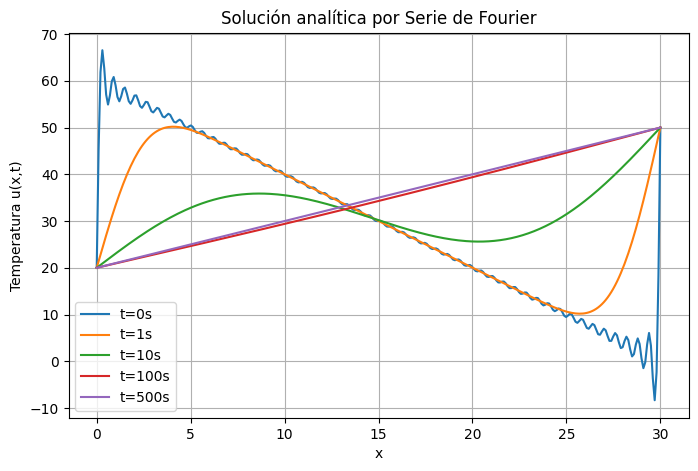

In [9]:
x_vals = np.linspace(0, L, 300)
t_list = [0, 1, 10, 100, 500]

plt.figure(figsize=(8,5))

for ti in t_list:
    ui = u_sol_calor(x_vals, ti)
    plt.plot(x_vals, ui, label=f"t={ti}s")

plt.title("Solución analítica por Serie de Fourier")
plt.xlabel("x")
plt.ylabel("Temperatura u(x,t)")
plt.legend()
plt.grid(True)
plt.show()


#### Onda


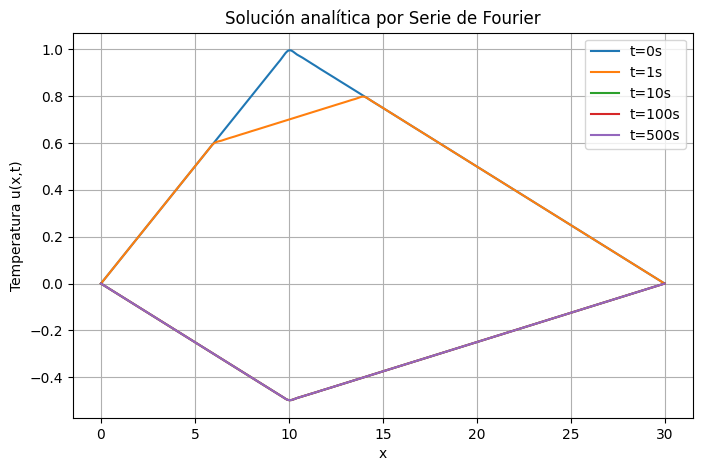

In [ ]:
x_vals = np.linspace(0, L, 300)
t_list = [0, 1, 10, 100, 500]

plt.figure(figsize=(8,5))

for ti in t_list:
    ui = u_sol_onda(x_vals, ti)
    plt.plot(x_vals, ui, label=f"t={ti}s")

plt.title("Solución analítica por Serie de Fourier")
plt.xlabel("x")
plt.ylabel("Temperatura u(x,t)")
plt.legend()
plt.grid(True)
plt.show()

# BLOQUE 7 - Animación 

#### Calor

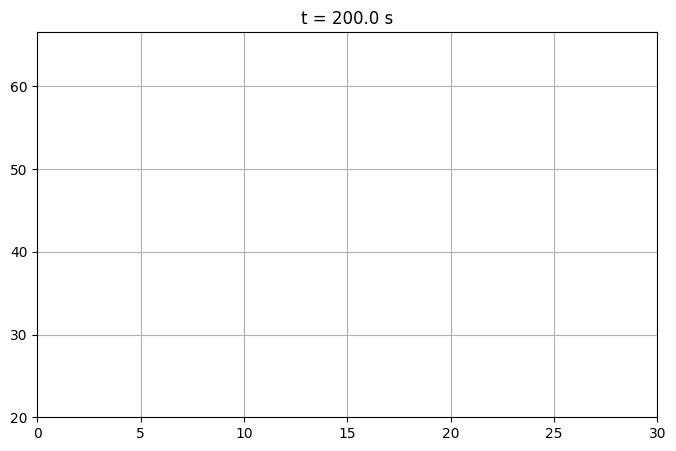

In [10]:
fig, ax = plt.subplots(figsize=(8,5))

line, = ax.plot([], [], lw=2)

ax.set_xlim(0, L)
ax.set_ylim(np.min(u_sol_calor(x_vals, 500)), np.max(u_sol_calor(x_vals, 0)))
ax.grid(True)

t_anim = np.linspace(0, 200, 300)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t_val = t_anim[frame]
    u_val = u_sol_calor(x_vals, t_val)
    line.set_data(x_vals, u_val)
    ax.set_title(f"t = {t_val:.1f} s")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(t_anim),
    init_func=init,
    interval=100,
    blit=False
)


from IPython.display import HTML
HTML(anim.to_jshtml())


#### Onda

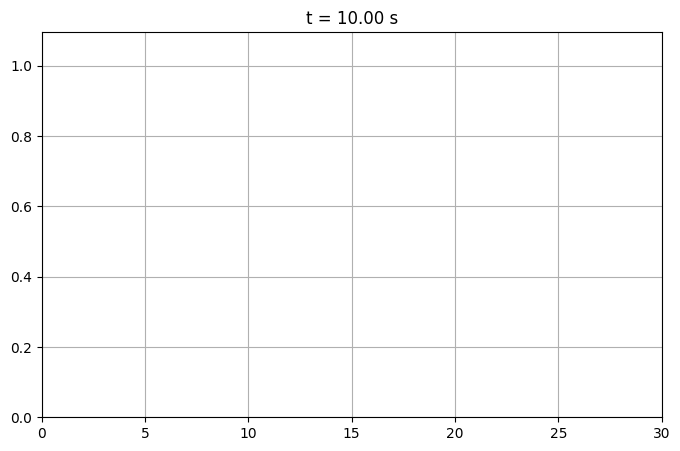

In [23]:
fig, ax = plt.subplots(figsize=(8,5))

line, = ax.plot([], [], lw=2)

modelo = "onda"

if modelo == "calor":
    u_test_min = u_sol_calor(x_vals, 500)
    u_test_max = u_sol_calor(x_vals, 0)
    ax.set_ylim(np.min(u_test_min), np.max(u_test_max))

elif modelo == "onda":
    u_test = u_sol_onda(x_vals, 0)
    ax.set_ylim(np.min(u_test)*1.1, np.max(u_test)*1.1)

ax.set_xlim(0, L)
ax.grid(True)

if modelo == "calor":
    t_anim = np.linspace(0, 500, 300)
else:
    t_anim = np.linspace(0, 10, 300)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t_val = t_anim[frame]
    
    if modelo == "calor":
        u_val = u_sol_calor(x_vals, t_val)
    else:
        u_val = u_sol_onda(x_vals, t_val)
    
    line.set_data(x_vals, u_val)
    ax.set_title(f"t = {t_val:.2f} s")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(t_anim),
    init_func=init,
    interval=50,
    blit=False
)

from IPython.display import HTML
HTML(anim.to_jshtml())

# BLOQUE 8 - Superficie 3D u(x,t)

#### Calor

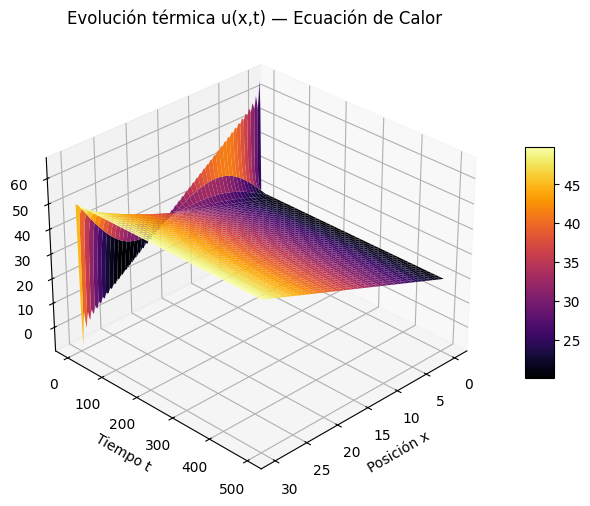

In [11]:

from mpl_toolkits.mplot3d import Axes3D

# Mallado de espacio y tiempo
x_vals = np.linspace(0, L, 200)
t_vals = np.linspace(0, 500, 1000)

X, T = np.meshgrid(x_vals, t_vals)

# Matriz U(x,t)
U = np.zeros_like(X)

for i in range(len(t_vals)):
    U[i, :] = u_sol_calor(x_vals, t_vals[i])

# Figura 3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
# Rotar la vista 3D
ax.view_init(elev=30, azim=45)

surf = ax.plot_surface(X, T, U, cmap='inferno', edgecolor='none')

ax.set_title("Evolución térmica u(x,t) — Ecuación de Calor")
ax.set_xlabel("Posición x")
ax.set_ylabel("Tiempo t")
ax.set_zlabel("Temperatura u")

fig.colorbar(surf, shrink=0.5, aspect=8)
plt.show()



#### Onda

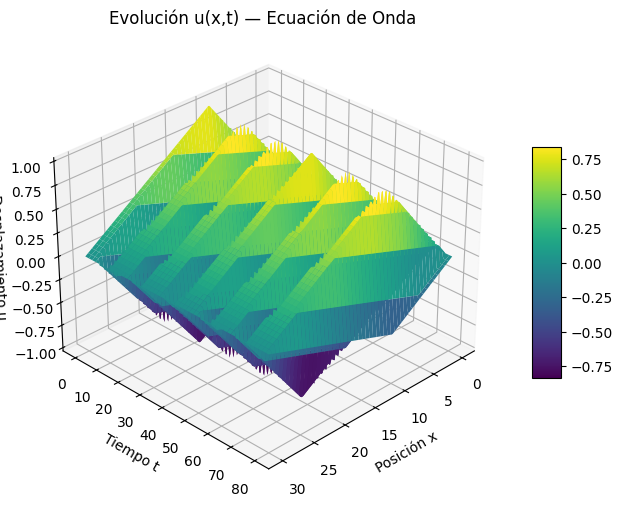

In [24]:
from mpl_toolkits.mplot3d import Axes3D

# Mallado de espacio y tiempo
x_vals = np.linspace(0, L, 200)
t_vals = np.linspace(0, 80, 200)  # la onda oscila rápido → tiempos pequeños

X, T = np.meshgrid(x_vals, t_vals)

# Matriz U(x,t)
U = np.zeros_like(X)

for i in range(len(t_vals)):
    U[i, :] = u_sol_onda(x_vals, t_vals[i])

# Figura 3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
# Rotar la vista 3D
ax.view_init(elev=30, azim=45)
surf = ax.plot_surface(X, T, U, cmap='viridis', edgecolor='none')

ax.set_title("Evolución u(x,t) — Ecuación de Onda")
ax.set_xlabel("Posición x")
ax.set_ylabel("Tiempo t")
ax.set_zlabel("Desplazamiento u")

fig.colorbar(surf, shrink=0.5, aspect=8)
plt.show()


# Bloque 9 - Solución con FTCS y comparaciones

#### Calor

Ejecutando FTCS con nx = 10


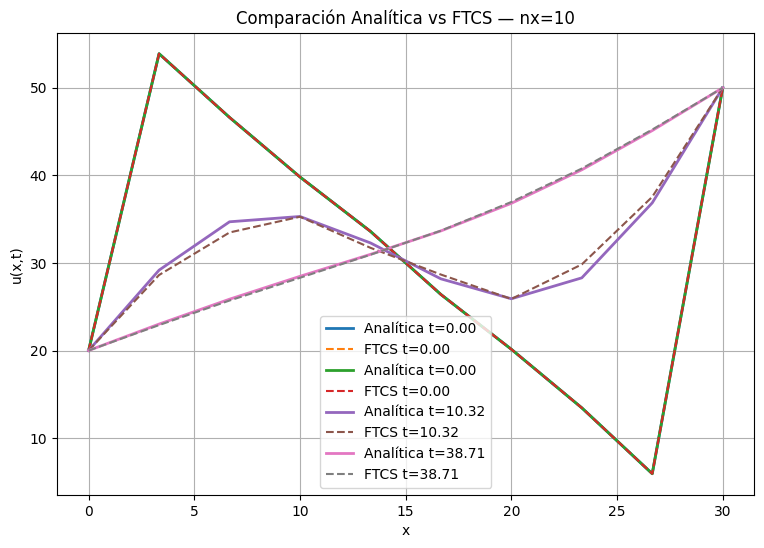

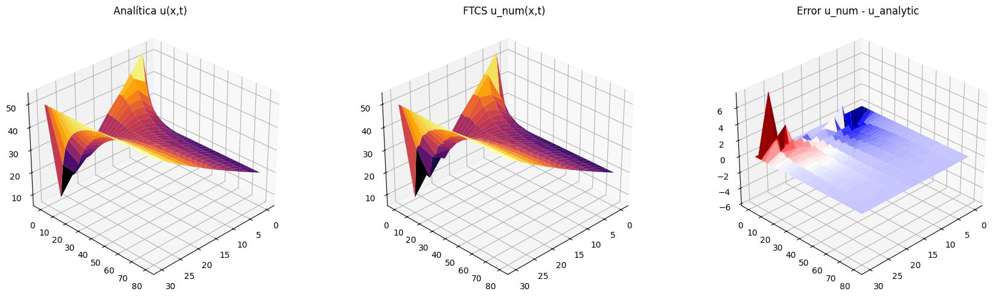

In [14]:
def explicit_fd(f_init, L, a, T0, TL, nx, t_max):

    dx = L/(nx-1)
    
    # dt controlado por estabilidad CFL
    dt = 0.45 * dx**2 / a     
    nt = int(t_max / dt) + 1

    x_grid = np.linspace(0, L, nx)
    times = np.linspace(0, t_max, nt)

    u = f_init(x_grid)
    u[0], u[-1] = T0, TL
    
    hist = np.zeros((nt, nx))
    hist[0] = u.copy()

    r = a * dt / dx**2

    for k in range(1, nt):
        un = u.copy()
        u[1:-1] = un[1:-1] + r*(un[2:] - 2*un[1:-1] + un[:-2])
        u[0], u[-1] = T0, TL
        hist[k] = u.copy()

    return x_grid, times, hist

nx_num = 10
t_max  = 80.0

print(f"Ejecutando FTCS con nx = {nx_num}")

f_init_fn = lambda X: u_sol_calor(X, 0)

x_num, t_num, U_num_hist = explicit_fd(
    f_init_fn, L, alpha, T0, TL,
    nx=nx_num,
    t_max=t_max
)

U_analytic_hist = np.zeros_like(U_num_hist)
for i, tt in enumerate(t_num):
    U_analytic_hist[i] = u_sol_calor(x_num, tt)

t_compare = [0, 1, 10, 40]

plt.figure(figsize=(9,6))
for tt in t_compare:
    idx = np.argmin(np.abs(t_num - tt))
    plt.plot(x_num, U_analytic_hist[idx], lw=2, label=f"Analítica t={t_num[idx]:.2f}")
    plt.plot(x_num, U_num_hist[idx], '--', lw=1.5, label=f"FTCS t={t_num[idx]:.2f}")
plt.title(f"Comparación Analítica vs FTCS — nx={nx_num}")
plt.xlabel("x"); plt.ylabel("u(x,t)")
plt.grid(True); plt.legend()
plt.show()

x_surf, t_surf = x_num, t_num
X_surf, T_surf = np.meshgrid(x_surf, t_surf)

U_analytic_surf = U_analytic_hist
U_num_surf = U_num_hist

fig = plt.figure(figsize=(18,5))

# analítica
ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(X_surf, T_surf, U_analytic_surf, cmap='inferno')
ax1.set_title("Analítica u(x,t)")
ax1.view_init(30,45)

# numérica
ax2 = fig.add_subplot(132, projection='3d')
ax2.plot_surface(X_surf, T_surf, U_num_surf, cmap='inferno')
ax2.set_title("FTCS u_num(x,t)")
ax2.view_init(30,45)

# error
ax3 = fig.add_subplot(133, projection='3d')
ax3.plot_surface(X_surf, T_surf, U_num_surf - U_analytic_surf, cmap='seismic')
ax3.set_title("Error u_num - u_analytic")
ax3.view_init(30,45)

plt.tight_layout()
plt.show()


#### Onda

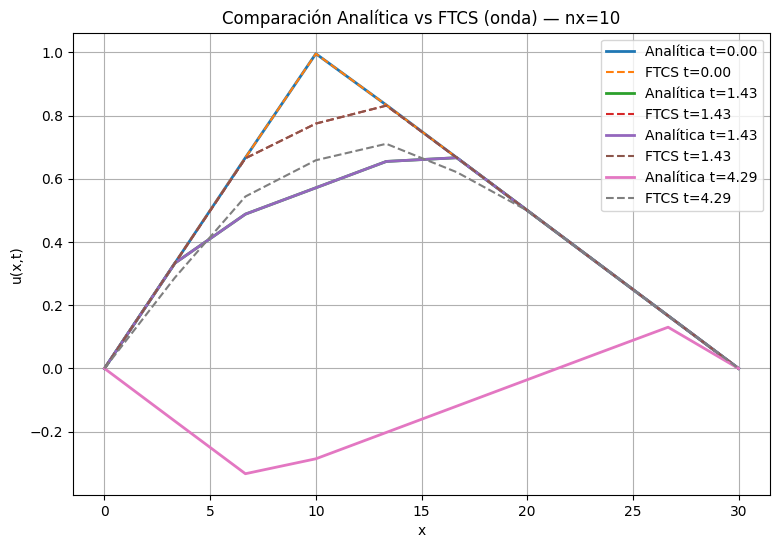

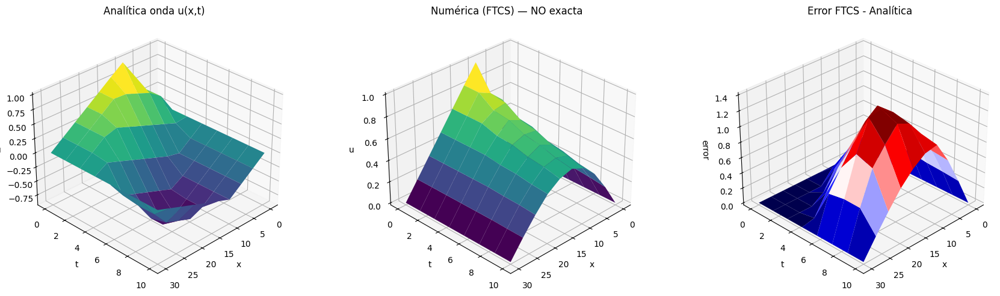

In [26]:
nx_num = 10
t_max  = 10.0

f_init_fn = lambda X: u_sol_onda(X, 0)


x_num, t_num, U_num_hist = explicit_fd(
    f_init_fn, L, a, T0, TL,
    nx=nx_num,
    t_max=t_max
)

U_analytic_hist = np.zeros_like(U_num_hist)
for i, tt in enumerate(t_num):
    U_analytic_hist[i, :] = u_sol_onda(x_num, tt)


t_compare = [0.0, 1.0, 2.0, 4.0]

plt.figure(figsize=(9,6))
for tt in t_compare:
    idx = np.argmin(np.abs(t_num - tt))
    plt.plot(x_num, U_analytic_hist[idx], '-', lw=2, label=f'Analítica t={t_num[idx]:.2f}')
    plt.plot(x_num, U_num_hist[idx], '--', lw=1.5, label=f'FTCS t={t_num[idx]:.2f}')
plt.xlabel('x'); plt.ylabel('u(x,t)')
plt.title(f'Comparación Analítica vs FTCS (onda) — nx={nx_num}')
plt.legend(); plt.grid(True)
plt.show()

x_surf, t_surf, U_num_surf = explicit_fd(f_init_fn, L, a, T0, TL, nx=nx_num, t_max=t_max)

U_analytic_surf = np.zeros_like(U_num_surf)
for i, tt in enumerate(t_surf):
    U_analytic_surf[i, :] = u_sol_onda(x_surf, tt)

X_surf, T_surf = np.meshgrid(x_surf, t_surf)

fig = plt.figure(figsize=(18,5))

ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(X_surf, T_surf, U_analytic_surf, cmap='viridis', edgecolor='none')
ax1.set_title("Analítica onda u(x,t)")
ax1.set_xlabel("x"); ax1.set_ylabel("t"); ax1.set_zlabel("u")
ax1.view_init(elev=30, azim=45)

ax2 = fig.add_subplot(132, projection='3d')
ax2.plot_surface(X_surf, T_surf, U_num_surf, cmap='viridis', edgecolor='none')
ax2.set_title("Numérica (FTCS) — NO exacta")
ax2.set_xlabel("x"); ax2.set_ylabel("t"); ax2.set_zlabel("u")
ax2.view_init(elev=30, azim=45)

ax3 = fig.add_subplot(133, projection='3d')
ax3.plot_surface(X_surf, T_surf, U_num_surf - U_analytic_surf, cmap='seismic', edgecolor='none')
ax3.set_title("Error FTCS - Analítica")
ax3.set_xlabel("x"); ax3.set_ylabel("t"); ax3.set_zlabel("error")
ax3.view_init(elev=30, azim=45)

plt.tight_layout()
plt.show()


# Bloque 10 - Análisis de error y convergencia

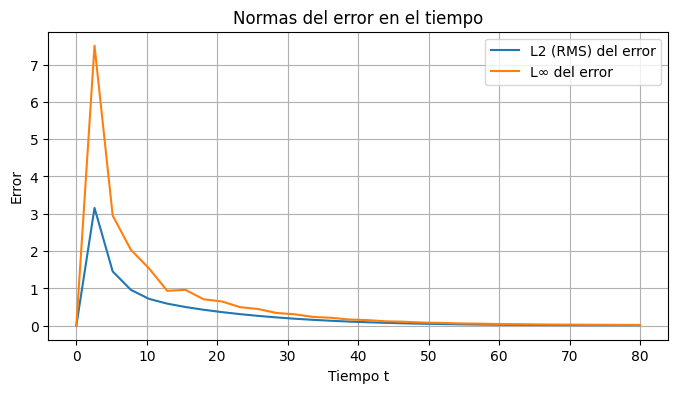

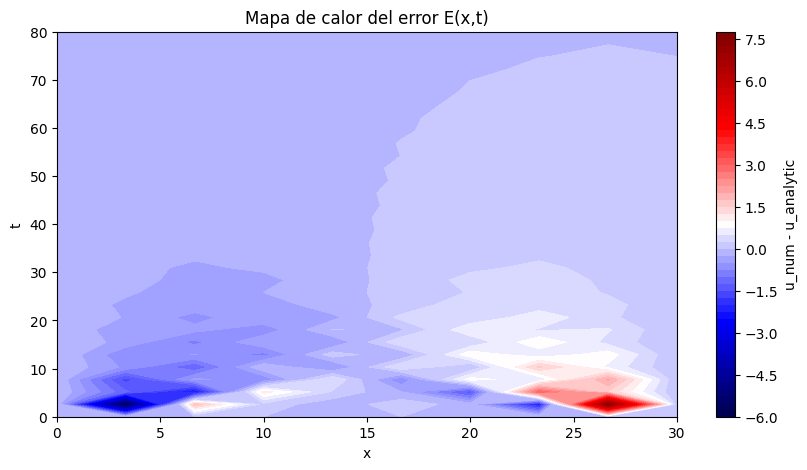

nx 	 L2 error @ t_final
50	 4.219587e-03
100	 1.229874e-03
200	 1.882337e-04
400	 6.767316e-05


In [15]:
Error = U_num_hist - U_analytic_hist

L2 = np.sqrt(np.sum(Error**2, axis=1) / Error.shape[1])
Linf = np.max(np.abs(Error), axis=1)

plt.figure(figsize=(8,4))
plt.plot(t_num, L2, label='L2 (RMS) del error')
plt.plot(t_num, Linf, label='L∞ del error')
plt.xlabel('Tiempo t'); plt.ylabel('Error')
plt.title('Normas del error en el tiempo')
plt.legend(); plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.contourf(x_num, t_num, Error, levels=60, cmap='seismic')
plt.colorbar(label='u_num - u_analytic')
plt.xlabel('x'); plt.ylabel('t')
plt.title('Mapa de calor del error E(x,t)')
plt.show()

t_final = min(40.0, t_num[-1])
nx_list = [50, 100, 200, 400]
errors_final = []

for nx_test in nx_list:
    x_test, t_test, U_test = explicit_fd(f_init_fn, L, alpha, T0, TL, nx=nx_test, t_max=t_final)
    U_num_final = U_test[-1, :]
    U_analytic_final = u_sol_calor(x_test, t_final)
    err_L2 = np.sqrt(np.sum((U_num_final - U_analytic_final)**2) / U_num_final.size)
    errors_final.append(err_L2)

print("nx \t L2 error @ t_final")
for nxv, ev in zip(nx_list, errors_final):
    print(f"{nxv}\t {ev:.6e}")

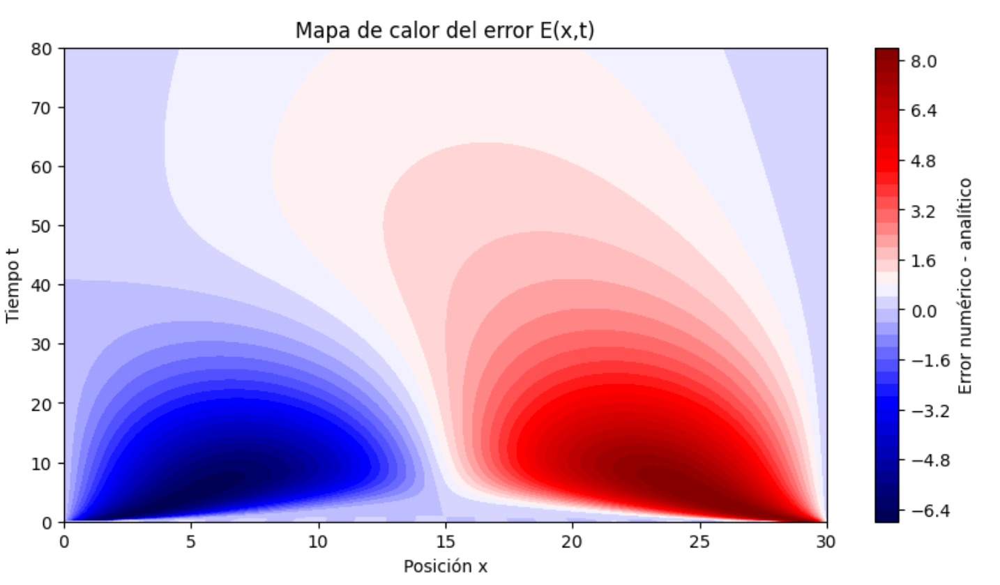
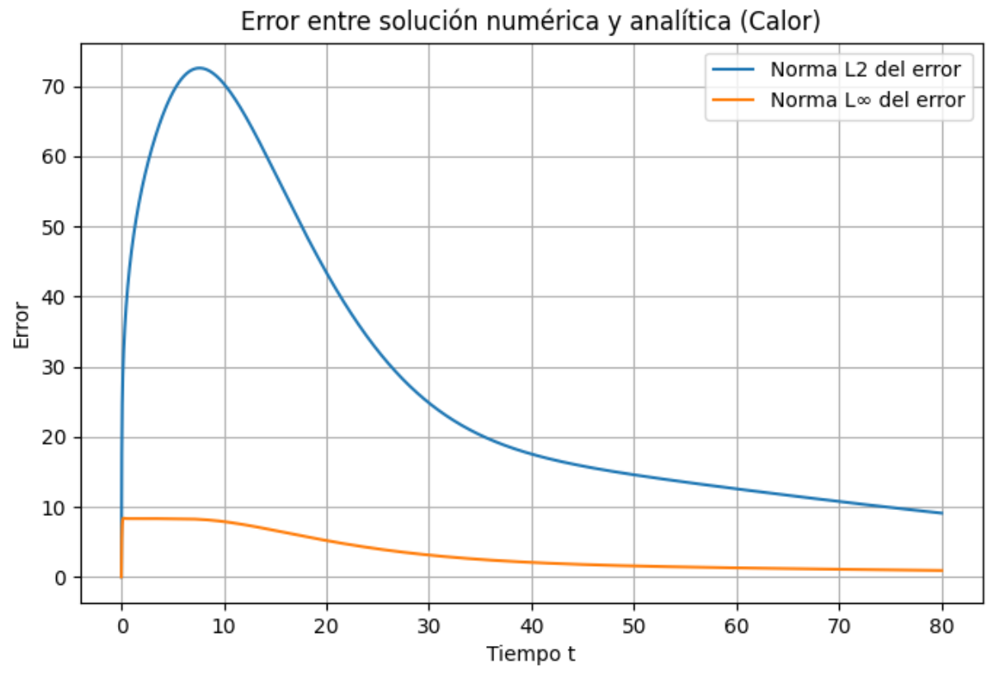